In [3]:
library(pheatmap)  
library(tidyverse)
library(RColorBrewer)
library(viridis)
library(reshape2)
library( org.Hs.eg.db ) 
library(AnnotationDbi) 
library(Biobase)
library(limma)
library(tximport)

library(stringr)

library(Rtsne)
library(caret)  
library(clusterProfiler)
library(pheatmap)
library(ReactomePA)
library(annotate)
library(seqinr)
# library(qlcMatrix)


In [4]:
save_pheatmap_png <- function(x, filename, width=1200, height=1000, res = 200) {
  png(filename, width = width, height = height, res = res)
  grid::grid.newpage()
  grid::grid.draw(x$gtable)
  dev.off()
}


In [7]:
save_prefix = '../data/processed/fig1/rna/'

# differential expression analysis

In [5]:
rna_files = as.array(list.files('../data/raw/rna/', pattern=('*/*.genes.results'),recursive=TRUE))
# data.frame(file_path = rna_files)
tissues = as.array(lapply(rna_files, function(x) strsplit(x, '/')[[1]][1]))
sample = as.array(lapply(rna_files, function(x) strsplit(x, '/')[[1]][2]))
sample = as.array(lapply(sample, function(x) strsplit(x, '.genes.results')[[1]][1]))

full_path = as.array(lapply(rna_files, function(x) paste0('../data/raw/rna/',x)))
                
rna_genes_result = data.frame("tissues" = tissues,"sample"=sample,"full_path"=full_path )  
rownames(rna_genes_result) = rna_genes_result$sample        
head(rna_genes_result  )                          

,tissues,sample,full_path
,<list>,<list>,<list>
A431-1-CTRLi,A431-CTRLi,A431-1-CTRLi,../data/raw/rna/A431-CTRLi/A431-1-CTRLi.genes.results
A431-2-CTRLi,A431-CTRLi,A431-2-CTRLi,../data/raw/rna/A431-CTRLi/A431-2-CTRLi.genes.results
A431-1-p63i,A431-p63i,A431-1-p63i,../data/raw/rna/A431-p63i/A431-1-p63i.genes.results
A431-2-p63i,A431-p63i,A431-2-p63i,../data/raw/rna/A431-p63i/A431-2-p63i.genes.results
Airway-B1,Airway,Airway-B1,../data/raw/rna/Airway/Airway-B1.genes.results
Airway-B2,Airway,Airway-B2,../data/raw/rna/Airway/Airway-B2.genes.results


In [6]:
# files <- file.path(full_path)
# names(files) <- rna_genes_result$sample
# txi.rsem <- tximport(files, type = "rsem", txIn = FALSE, txOut = FALSE)
### ERROR Need to make all rownames the same...

In [7]:

createSig <- function (data, metadata, col_sel,tissue=TRUE, logFC_thres=.1, p_thres=0.05,max_return = 500) {
    # Differential expression analysis with limmma
    # This function takes in a target
    # Output is a result table of differential expression analysis for target vs control

    # load data and preprocess
#     metadata_sel <- labels_df %>% 
#         filter(control==control_id)%>%
#         filter(label == target | label == "control")%>%
#         dplyr::select(-control)    
#     rownames(metadata_sel) = metadata_sel$sample
#     data <- counts_all_filt[ ,rownames(metadata_sel) ]
#     log_data <- log2(data+1) 
    
#     metadata = data.frame("column" =cols_all)
    if (tissue){
    metadata = metadata %>% 
        mutate(label = if_else(tissues==col_sel, 'target', 'control'))
    }
    else{
         metadata = metadata %>% 
        mutate(label = if_else(group==col_sel, 'target', 'control'))
    }

    # set up the design
    labels <- factor(metadata$label)
    design <- model.matrix(~ labels + 1)
    colnames(design) <- levels(labels)
    rownames(design) <- metadata$tissue

    # proceed with analysis
    fit <- lmFit(data, design)
    fit <- eBayes(fit, trend=TRUE)
    tT = topTable(fit, coef=ncol(design),adjust="fdr", sort.by="p", number=Inf)
    tT$gene = rownames(tT)
    tT = na.omit(tT)
    tT_filt = tT[tT$logFC>logFC_thres  & tT$adj.P.Val<p_thres,]
    tT_filt = tT_filt%>% arrange(desc(logFC))
    print(dim(tT_filt))
    tT_filt = tT_filt[1:min(max_return, dim(tT_filt)[1]),]

  return(tT_filt)
}

In [8]:
rna_tpm_file_tissue = '../data/interim/rna/tissue_tpm_sym.csv'
rna_df_tissue = read.csv(rna_tpm_file_tissue, row.names=1,stringsAsFactors=F,check.names = FALSE)
rna_df_tissue_log = log2(rna_df_tissue+1e-2)
rna_df_tissue_norm = as.data.frame(scale(rna_df_tissue_log, center = TRUE, scale = TRUE))


In [9]:
rna_tpm_file = '../data/interim/rna/sample_tpm_sym.csv'
rna_df = read.csv(rna_tpm_file, row.names=1,stringsAsFactors=F,check.names = FALSE)
rna_df_log = log2(rna_df+1e-2)
rna_df_norm = as.data.frame(scale(rna_df_log, center = TRUE, scale = TRUE))
head(rna_df_norm)

,A431-1-CTRLi,A431-1-p63i,A431-2-CTRLi,A431-2-p63i,Airway-B1,Airway-B2,Astrocytes-B1,Astrocytes-B2,Bladder-B1,Bladder-B2,⋯,Uterine-B1,Uterine-B2,WM2664-SCR-DMSO-BR1,WM2664-SCR-DMSO-BR2,WM2664-SCR-PLX-BR1,WM2664-SCR-PLX-BR2,WM2664-shMITF-DMSO-BR1,WM2664-shMITF-DMSO-BR2,WM2664-shMITF-PLX-BR1,WM2664-shMITF-PLX-BR2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,0.6417831,0.6623433,0.7994448,0.7303720,0.6541822,0.7392987,1.1087689,1.1485692,0.65029894,0.7204134,⋯,0.61458326,0.5914140,1.5838919,1.6188556,1.6918717,1.7822770,1.675711913,1.6293048,1.70953587,1.74049731
A1BG-AS1,0.2892481,-0.5210944,-0.5150074,-0.5875764,-0.5020608,-0.4581187,-0.1194657,0.1052466,-0.46525912,-1.0460320,⋯,-0.50740969,-0.8272739,0.1171384,-0.2481127,-0.2092722,0.1470238,-0.004195876,-0.1286889,0.02483362,-0.07187348
A1CF,-1.0291413,-1.0467041,-1.0465532,-1.0575809,-1.0307378,-0.8255721,-0.9271780,-0.9030065,-0.71791710,-1.0460320,⋯,-1.04026653,-0.8272739,-1.0922663,-1.0844294,-1.1073494,-1.0773221,-1.090981737,-1.1004495,-1.11086299,-1.10838445
A2M,-1.0291413,-0.2942805,-0.5150074,-1.0575809,-1.0307378,-1.0288821,1.5053966,1.3031655,-0.01205829,0.5220445,⋯,0.23973259,0.3963941,1.3563672,1.5210301,1.4110784,1.6776894,1.475314446,1.4816454,1.48087546,1.52600059
A2M-AS1,-1.0291413,-1.0467041,-1.0465532,-0.8551610,-1.0307378,-0.5033333,-0.6538820,-0.3925620,-1.04551518,-1.0460320,⋯,-1.04026653,-1.0352871,-0.5197864,-0.6093506,-0.7832793,-0.5998701,-0.682563644,-0.4873368,-0.40354425,-0.25155746
A2ML1,-0.6083868,-0.5745781,-1.0465532,-1.0575809,0.3367865,0.3068355,-0.5535247,-0.5740544,0.41275087,0.2953998,⋯,0.07828831,-0.2655465,-1.0922663,-1.0844294,-1.1073494,-1.0773221,-0.517694465,-1.1004495,-0.35426750,-1.10838445


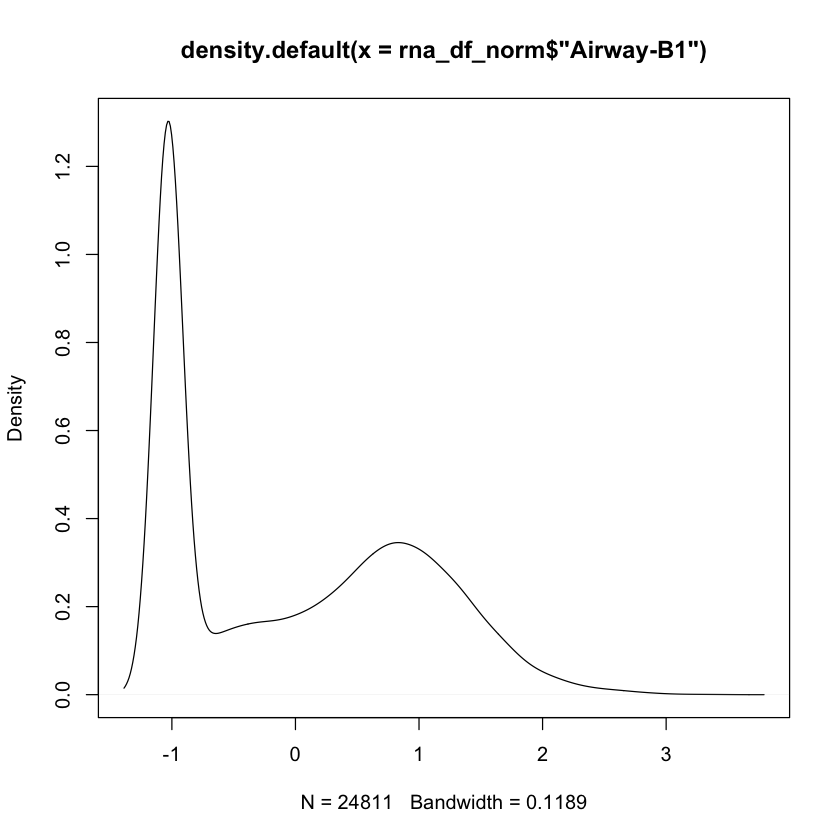

In [10]:
par (bg='white')
plot(density(rna_df_norm$"Airway-B1"))

In [11]:
# # rna_df_essential_long = gather(rna_df_norm,"tissue", "log_TPM")
# ggplot(gather(as.data.frame(rna_df_norm),"tissue", "log_TPM"), aes(x=log_TPM,color=tissue))+geom_density()

In [12]:
normal_tissues = c('Airway','Astrocytes','Bladder','Colon','Esophageal',
'GDSD0',
'GDSD3',
'GDSD6',
'GM12878',
'HMEC',
'Melanocytes',
'Ovarian',
'Pancreas',
'Prostate',
'Renal',
'Thyroid',
'Uterine')



In [13]:
rna_genes_result_normal = rna_genes_result[rna_genes_result$tissues %in% normal_tissues,]
normal_samples = as.array(rna_genes_result_normal$sample)

- grey: 'GM12878'
- purple: 'GDSD0','GDSD3','GDSD6','Airway','Prostate','Breast','Bladder','Uterine'
- green: 'Renal', 'Colon', 'Ovarian', 'Thyroid', 'Esophageal','Pancreas'
- blue: 'Astrocytes', 'Melanocytes'

In [14]:
rna_genes_result_normal$group = c("purple","purple","blue","blue","purple","purple","green","green","green","green",
                                 "purple","purple","purple","purple","purple","purple",
                                 "grey","grey","purple","purple","blue","blue",
                                 "green","green","green","green","purple","purple",
                                 "green","green","green","green","purple","purple")
rna_genes_result_normal

,tissues,sample,full_path,group
,<list>,<list>,<list>,<chr>
Airway-B1,Airway,Airway-B1,../data/raw/rna/Airway/Airway-B1.genes.results,purple
Airway-B2,Airway,Airway-B2,../data/raw/rna/Airway/Airway-B2.genes.results,purple
Astrocytes-B1,Astrocytes,Astrocytes-B1,../data/raw/rna/Astrocytes/Astrocytes-B1.genes.results,blue
Astrocytes-B2,Astrocytes,Astrocytes-B2,../data/raw/rna/Astrocytes/Astrocytes-B2.genes.results,blue
Bladder-B1,Bladder,Bladder-B1,../data/raw/rna/Bladder/Bladder-B1.genes.results,purple
Bladder-B2,Bladder,Bladder-B2,../data/raw/rna/Bladder/Bladder-B2.genes.results,purple
Colon-B1,Colon,Colon-B1,../data/raw/rna/Colon/Colon-B1.genes.results,green
Colon-B2,Colon,Colon-B2,../data/raw/rna/Colon/Colon-B2.genes.results,green
Esophageal-B1,Esophageal,Esophageal-B1,../data/raw/rna/Esophageal/Esophageal-B1.genes.results,green


In [15]:
rna_normal = rna_df_log[,colnames(rna_df_log) %in% normal_samples]
# rna_normal = rna_df_norm[,colnames(rna_df_norm) %in% normal_samples]

dim(rna_normal)
rna_normal = na.omit(rna_normal)
dim(rna_normal)


[1] 24811    34

[1] 24811    34

In [16]:
#### per group


sig_genes_list = list()
sig_genes_combined = c()
for (group in c("grey","blue","green","purple")){
    tT_filt = createSig(rna_normal, rna_genes_result_normal,  col_sel=group,tissue=FALSE,max_return = 2500)
    print(group)
    print(dim(tT_filt))
    sig_genes_list[[group]] = tT_filt$gene
    sig_genes_combined = c(sig_genes_combined,tT_filt$gene)
}

[1] 1435    7
[1] "grey"
[1] 1435    7
[1] 2632    7
[1] "blue"
[1] 2500    7
[1] 2480    7
[1] "green"
[1] 2480    7
[1] 2033    7
[1] "purple"
[1] 2033    7


In [17]:
# #### per tissue (didn't work)


# sig_genes_list = list()
# sig_genes_combined = c()
# for (tissue_sel in normal_tissues){
#     tT_filt = createSig(rna_normal, rna_genes_result_normal, tissue_sel,max_return = 50)
#     print(tissue_sel)
#     print(dim(tT_filt))
#     sig_genes_list[[tissue_sel]] = tT_filt$gene
#     sig_genes_combined = c(sig_genes_combined,tT_filt$gene)
# }

In [18]:
length(sig_genes_combined)
# sig_genes_combined = unique(sort(sig_genes_combined))
sig_genes_combined = unique(sig_genes_combined)
length(sig_genes_combined)

[1] 8448

[1] 8312

In [19]:
# # rna_df[sig_genes_combined[1],]
# # rna_normal[sig_genes_combined[1],]
# rna_df_tissue[sig_genes_combined[1],normal_tissues]
# rna_df_tissue_norm[sig_genes_combined[1],normal_tissues]

In [20]:
# rna_normal_sel = rna_normal[sig_genes_combined,]
# dim(rna_normal_sel)
# rna_normal_sel = rna_normal_sel[apply(rna_normal_sel,1,max)>0,]
# dim(rna_normal_sel)
# head(rna_normal_sel)

In [21]:
# sig_genes_sel = c(sig_genes_list$Astrocytes, sig_genes_list$GDSD6, sig_genes_list$GM12878, sig_genes_list$Prostate)
# sig_genes_sel = unique(sort(sig_genes_sel))
# length(sig_genes_sel)

In [22]:
normal_tissue_order = c('GM12878',
                        'Astrocytes', 'Melanocytes',
                         'Colon',  'Esophageal','Ovarian', 'Pancreas','Renal','Thyroid',
                        'Airway','Bladder','GDSD0','GDSD3','GDSD6','HMEC','Prostate','Uterine')


In [23]:
annon_df = rna_genes_result_normal%>%
    dplyr::select( tissues, group)%>%
    unique()
rownames(annon_df) = annon_df$tissues
annon_df = dplyr::select(annon_df, group)
annon_df

,group
,<chr>
Airway,purple
Astrocytes,blue
Bladder,purple
Colon,green
Esophageal,green
GDSD0,purple
GDSD3,purple
GDSD6,purple
GM12878,grey


In [24]:
write.csv(annon_df, '../data/processed/fig1/annon_df.csv')

In [25]:
rna_df_tissue_norm_sig = rna_df_tissue_norm[sig_genes_combined,normal_tissue_order]
# rna_df_tissue_norm_sig = rna_df_tissue_norm[sig_genes_sel,normal_tissue_order]
dim(rna_df_tissue_norm_sig)
rna_df_tissue_norm_sig[rna_df_tissue_norm_sig>1] = 1
rna_df_tissue_norm_sig[rna_df_tissue_norm_sig< -1] = -1
rna_df_tissue_norm_sig = rna_df_tissue_norm_sig[apply(rna_df_tissue_norm_sig,1,max)>0 ,]
rna_df_tissue_norm_sig = rna_df_tissue_norm_sig[apply(rna_df_tissue_norm_sig,1,sum)< 7,]
rna_df_tissue_norm_sig = rna_df_tissue_norm_sig[apply(rna_df_tissue_norm_sig,1,sd)>0.2 ,]
select_genes = rownames(rna_df_tissue_norm_sig)
dim(rna_df_tissue_norm_sig)

[1] 8312   17

[1] 3053   17

pdf 
  2

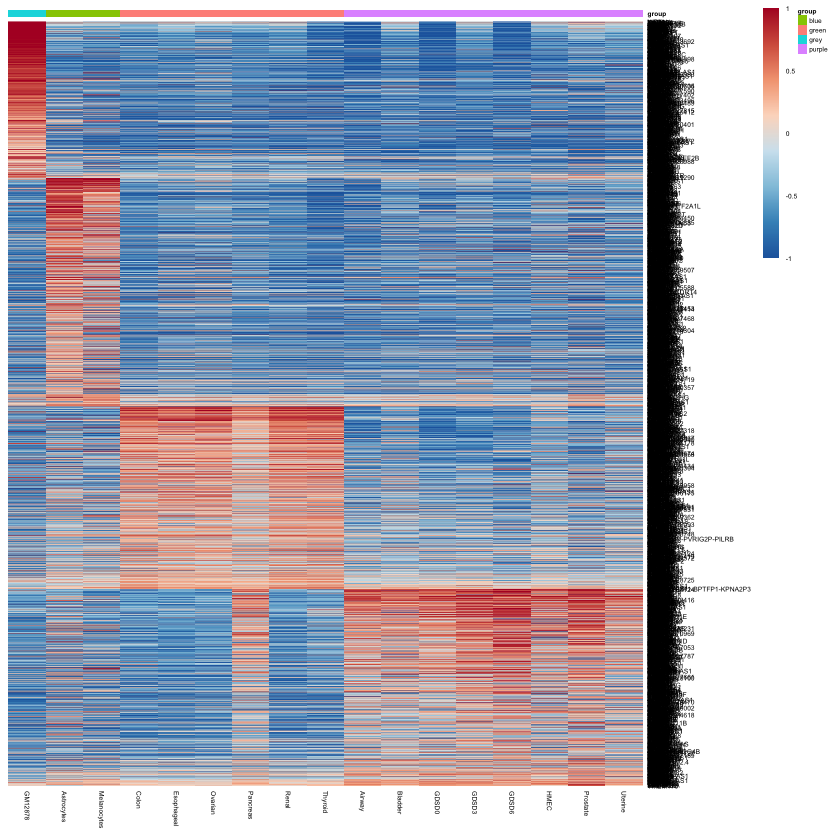

In [26]:
p_with_genes = pheatmap(rna_df_tissue_norm_sig,
             cluster_rows=F,
             cluster_cols=F,
            fontsize=4,
             annotation_col=annon_df,
               color = colorRampPalette(rev(brewer.pal(n =8, name ="RdBu")))(255))

save_pheatmap_png(p_with_genes, paste0(save_prefix, 'rna_heatmap.png'), width=1200, height=40000, res = 200) 

pdf 
  2

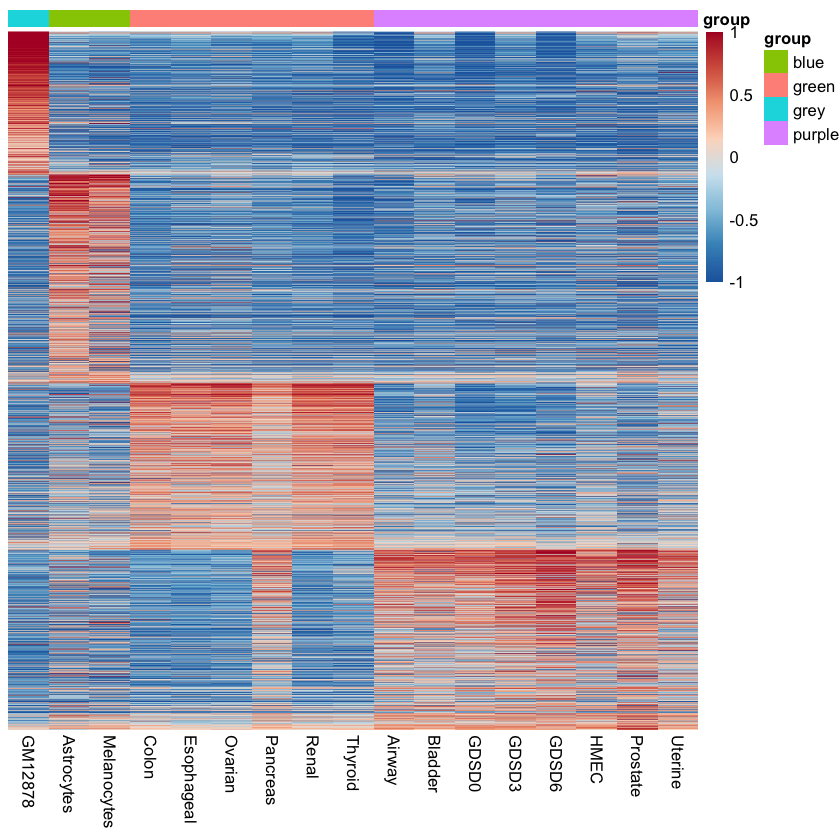

In [27]:
p_no_genes = pheatmap(rna_df_tissue_norm_sig,
             cluster_rows=F,
             cluster_cols=F,
                show_rownames=F,
             annotation_col=annon_df,
               color = colorRampPalette(rev(brewer.pal(n =8, name ="RdBu")))(255))

save_pheatmap_png(p_no_genes, paste0(save_prefix, 'rna_heatmap_no_genes.png'), width=3000, height=3000, res = 500) 

# getting gene signatures

In [28]:
purple_genes= sig_genes_list$purple[ sig_genes_list$purple %in% select_genes]
length(purple_genes)
green_genes = sig_genes_list$green[ sig_genes_list$green %in% select_genes]
length(green_genes)
blue_genes  = sig_genes_list$blue[ sig_genes_list$blue %in% select_genes]
length(blue_genes)
grey_genes  = sig_genes_list$grey[ sig_genes_list$grey %in% select_genes]
length(grey_genes)
all_genes = rownames(rna_df_tissue_norm)
length(all_genes)

[1] 796

[1] 759

[1] 954

[1] 626

[1] 24811

In [31]:
library(VennDiagram)
 
# Chart
venn.diagram(
  x = list(purple_genes, green_genes, blue_genes,grey_genes),
  category.names = c("purple", "green", "blue", "grey"),
  filename = paste0(save_prefix,'venn_diagram.svg'),
#   output=TRUE
 # Output features
    imagetype="svg" ,
    height = 480 , 
    width = 480 , 
    resolution = 300,
    compression = "lzw",

    # Circles
    lwd = 2,
    lty = 'blank',
    fill = c("purple","green", "blue", "grey"),
 )       

[1] 1

In [129]:
write.table(sort(purple_genes), file = paste0(save_prefix, "purple_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(green_genes), file = paste0(save_prefix, "green_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(blue_genes), file = paste0(save_prefix, "blue_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(grey_genes), file = paste0(save_prefix, "grey_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(all_genes), file = paste0(save_prefix, "all_genes.csv"),row.names=FALSE,col.names=FALSE)


In [75]:
length(sig_loop_combined)
# sig_genes_combined = unique(sort(sig_genes_combined))
sig_loop_combined = unique(sig_loop_combined)
length(sig_loop_combined)

[1] 50000

[1] 49999

In [76]:
tissue_loop_sig = tissue_loop_df_norm[sig_loop_combined,normal_tissue_order]
# rna_df_tissue_norm_sig = rna_df_tissue_norm[sig_genes_sel,normal_tissue_order]
dim(tissue_loop_sig)
tissue_loop_sig[tissue_loop_sig>3] = 3
tissue_loop_sig[tissue_loop_sig< -3] = -3
tissue_loop_sig = tissue_loop_sig[apply(tissue_loop_sig,1,max)>0 ,]
# tissue_loop_sig = tissue_loop_sig[apply(tissue_loop_sig,1,sum)< 7,]
tissue_loop_sig = tissue_loop_sig[apply(tissue_loop_sig,1,sd)>0.2 ,]
select_loops = rownames(tissue_loop_sig)
dim(tissue_loop_sig)

[1] 49999    17

[1] 49999    17

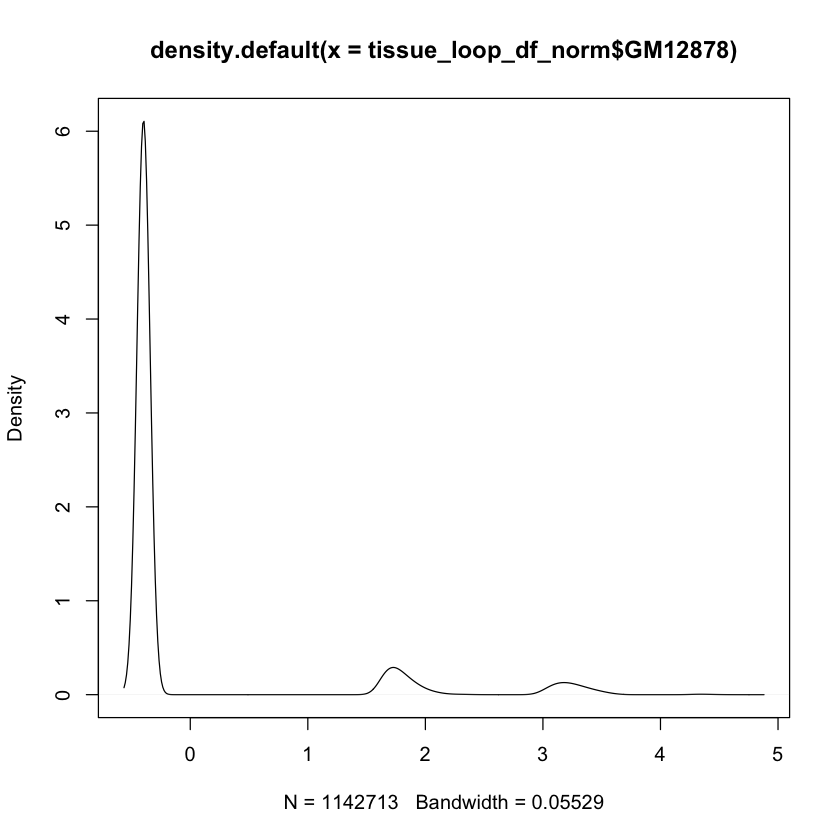

In [83]:
par (bg='white')
plot(density(tissue_loop_df_norm$"GM12878"))

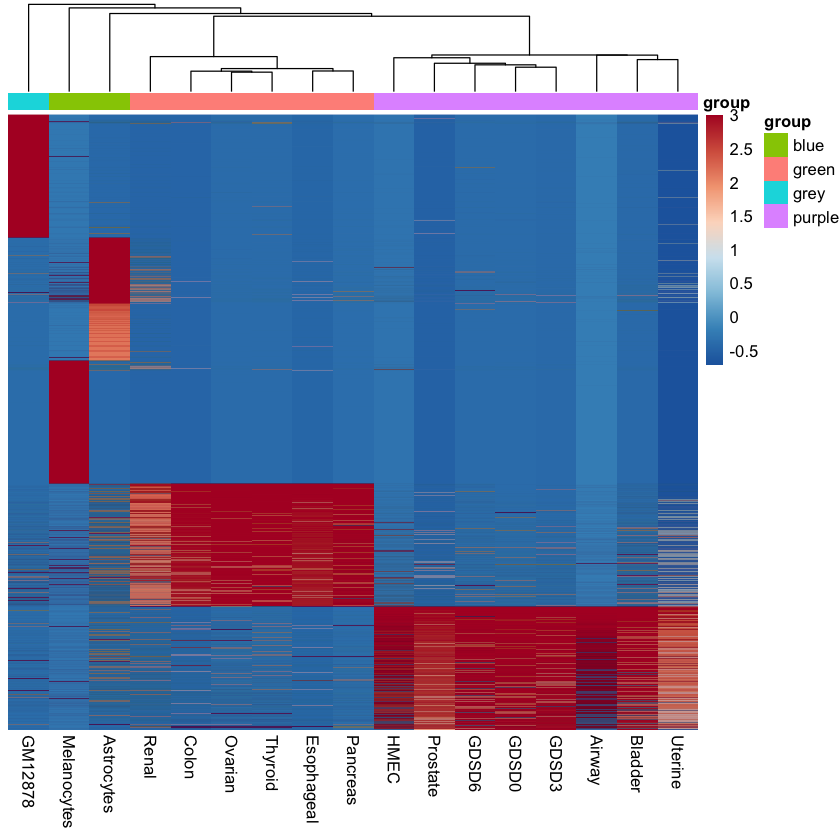

In [77]:
p_10000 = pheatmap(tissue_loop_sig,
             cluster_rows=F,
             cluster_cols=T,
                show_rownames=F,
             annotation_col=annon_df,
               color = colorRampPalette(rev(brewer.pal(n =8, name ="RdBu")))(255))


In [80]:
save_pheatmap_png( p_10000, paste0(save_prefix, 'heatmap_top10000.png'), height=2000,width=2000,res=300)

pdf 
  2

# get gene signatures

In [65]:
purple_loops= sig_loop_list$purple[ sig_loop_list$purple %in% select_loops]
length(purple_loops)
green_loops = sig_loop_list$green[ sig_loop_list$green %in% select_loops]
length(green_loops)
blue_loops  = sig_loop_list$blue[ sig_loop_list$blue %in% select_loops]
length(blue_loops)
grey_loops  = sig_loop_list$grey[ sig_loop_list$grey %in% select_loops]
length(grey_loops)
all_loops = rownames(tissue_loop_df_norm)
length(all_loops)

[1] 10000

[1] 10000

[1] 234

[1] 10000

[1] 1142713

In [61]:
select_loops

[1] "chr6_295000_300000::chr6_315000_320000"              
    [2] "chr6_290000_295000::chr6_315000_320000"              
    [3] "chr8_11350000_11355000::chr8_11390000_11395000"      
    [4] "chr22_23250000_23255000::chr22_23270000_23275000"    
    [5] "chr11_111235000_111240000::chr11_111285000_111290000"
    [6] "chr11_111240000_111245000::chr11_111285000_111290000"
    [7] "chr14_22955000_22960000::chr14_22975000_22980000"    
    [8] "chr20_37470000_37475000::chr20_37500000_37505000"    
    [9] "chr2_231810000_231815000::chr2_231845000_231850000"  
   [10] "chr12_111105000_111110000::chr12_111125000_111130000"
   [11] "chr3_98250000_98255000::chr3_98270000_98275000"      
   [12] "chr22_23245000_23250000::chr22_23270000_23275000"    
   [13] "chr6_167505000_167510000::chr6_167525000_167530000"  
   [14] "chr14_22975000_22980000::chr14_23000000_23005000"    
   [15] "chr18_10925000_10930000::chr18_10950000_10955000"    
   [16] "chr3_98250000_98255000::chr3_98275000_98280000"      
   [17] "chr1_160400000_160405000::chr1_160420000_160425000"  
   [18] "chr20_46040000_46045000::chr20_46060000_46065000"    
   [19] "chr1_111740000_111745000::chr1_111760000_111765000"  
   [20] "chr3_186715000_186720000::chr3_186740000_186745000"  
   [21] "chr8_101485000_101490000::chr8_101505000_101510000"  
   [22] "chr8_11350000_11355000::chr8_11400000_11405000"      
   [23] "chr9_101995000_102000000::chr9_102015000_102020000"  
   [24] "chr1_112140000_112145000::chr1_112160000_112165000"  
   [25] "chr21_26835000_26840000::chr21_26860000_26865000"    
   [26] "chr2_172175000_172180000::chr2_172270000_172275000"  
   [27] "chr17_5100000_5105000::chr17_5135000_5140000"        
   [28] "chr10_97550000_97555000::chr10_97590000_97595000"    
   [29] "chr9_114745000_114750000::chr9_114795000_114800000"  
   [30] "chr11_111250000_111255000::chr11_111285000_111290000"
   [31] "chr6_285000_290000::chr6_315000_320000"              
   [32] "chr11_111245000_111250000::chr11_111285000_111290000"
   [33] "chr9_140630000_140635000::chr9_140655000_140660000"  
   [34] "chr16_81830000_81835000::chr16_81850000_81855000"    
   [35] "chr11_111235000_111240000::chr11_111280000_111285000"
   [36] "chr22_23250000_23255000::chr22_23275000_23280000"    
   [37] "chr9_37375000_37380000::chr9_37405000_37410000"      
   [38] "chr9_1875000_1880000::chr9_1935000_1940000"          
   [39] "chr20_46040000_46045000::chr20_46065000_46070000"    
   [40] "chr4_186230000_186235000::chr4_186260000_186265000"  
   [41] "chr8_125615000_125620000::chr8_125650000_125655000"  
   [42] "chr11_111240000_111245000::chr11_111280000_111285000"
   [43] "chr17_4275000_4280000::chr17_4300000_4305000"        
   [44] "chr6_295000_300000::chr6_320000_325000"              
   [45] "chr9_126080000_126085000::chr9_126100000_126105000"  
   [46] "chr22_23250000_23255000::chr22_23280000_23285000"    
   [47] "chr17_5105000_5110000::chr17_5125000_5130000"        
   [48] "chr12_92825000_92830000::chr12_92855000_92860000"    
   [49] "chr19_11670000_11675000::chr19_11690000_11695000"    
   [50] "chr10_125150000_125155000::chr10_125310000_125315000"
   [51] "chr12_92825000_92830000::chr12_92860000_92865000"    
   [52] "chr2_172175000_172180000::chr2_172260000_172265000"  
   [53] "chr17_4280000_4285000::chr17_4300000_4305000"        
   [54] "chr1_160515000_160520000::chr1_160545000_160550000"  
   [55] "chr22_23245000_23250000::chr22_23280000_23285000"    
   [56] "chr12_26880000_26885000::chr12_26900000_26905000"    
   [57] "chr16_86020000_86025000::chr16_86040000_86045000"    
   [58] "chr14_22955000_22960000::chr14_23000000_23005000"    
   [59] "chr17_5100000_5105000::chr17_5130000_5135000"        
   [60] "chr8_11350000_11355000::chr8_11385000_11390000"      
   [61] "chr12_92840000_92845000::chr12_92860000_92865000"    
   [62] "chr20_46080000_46085000::chr20_46100000_46105000"    
   [63] "chr1_160520000_160525000::chr1_160545000_160550000"  
   [64] "chr8_103545000_103550000::

# getting gene signatures

In [118]:
purple_genes= sig_genes_list$purple[ sig_genes_list$purple %in% select_genes]
length(purple_genes)
green_genes = sig_genes_list$green[ sig_genes_list$green %in% select_genes]
length(green_genes)
blue_genes  = sig_genes_list$blue[ sig_genes_list$blue %in% select_genes]
length(blue_genes)
grey_genes  = sig_genes_list$grey[ sig_genes_list$grey %in% select_genes]
length(grey_genes)
all_genes = rownames(rna_df_tissue_norm)
length(all_genes)

[1] 796

[1] 759

[1] 954

[1] 626

[1] 24811

In [129]:
write.table(sort(purple_genes), file = paste0(save_prefix, "purple_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(green_genes), file = paste0(save_prefix, "green_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(blue_genes), file = paste0(save_prefix, "blue_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(grey_genes), file = paste0(save_prefix, "grey_genes.csv"),row.names=FALSE,col.names=FALSE)
write.table(sort(all_genes), file = paste0(save_prefix, "all_genes.csv"),row.names=FALSE,col.names=FALSE)


## gene signature checking

In [8]:
purple_genes = read.table(file = paste0(save_prefix, "purple_genes.csv"))$V1
green_genes = read.table(file = paste0(save_prefix, "green_genes.csv"))$V1
blue_genes = read.table(file = paste0(save_prefix, "blue_genes.csv"))$V1
grey_genes = read.table(file = paste0(save_prefix, "grey_genes.csv"))$V1

In [120]:
purple_entrez = bitr(purple_genes, fromType="SYMBOL", toType="ENTREZID", OrgDb="org.Hs.eg.db")$ENTREZID
green_entrez = bitr(green_genes, fromType="SYMBOL", toType="ENTREZID", OrgDb="org.Hs.eg.db")$ENTREZID
blue_entrez = bitr(blue_genes, fromType="SYMBOL", toType="ENTREZID", OrgDb="org.Hs.eg.db")$ENTREZID
grey_entrez = bitr(grey_genes, fromType="SYMBOL", toType="ENTREZID", OrgDb="org.Hs.eg.db")$ENTREZID

all_entrez = bitr(all_genes, fromType="SYMBOL", toType="ENTREZID", OrgDb="org.Hs.eg.db")$ENTREZID


'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



In [121]:
length(purple_entrez)
length(green_entrez)
length(blue_entrez)
length(grey_entrez)
length(all_entrez)

[1] 796

[1] 760

[1] 954

[1] 627

[1] 24815

In [125]:
cluster_all <- list(purple = purple_entrez, 
                       green = green_entrez,
                      blue = blue_entrez,
                      grey = grey_entrez)

In [126]:
ck_reactome_90 <- compareCluster(geneCluster = cluster_all, 
                                 fun = "enrichPathway", pAdjustMethod='none', pvalueCutoff = 1,readable=TRUE)
write.csv(ck_reactome_90, file = paste0(save_prefix, "ck_reactome_groups.csv"))

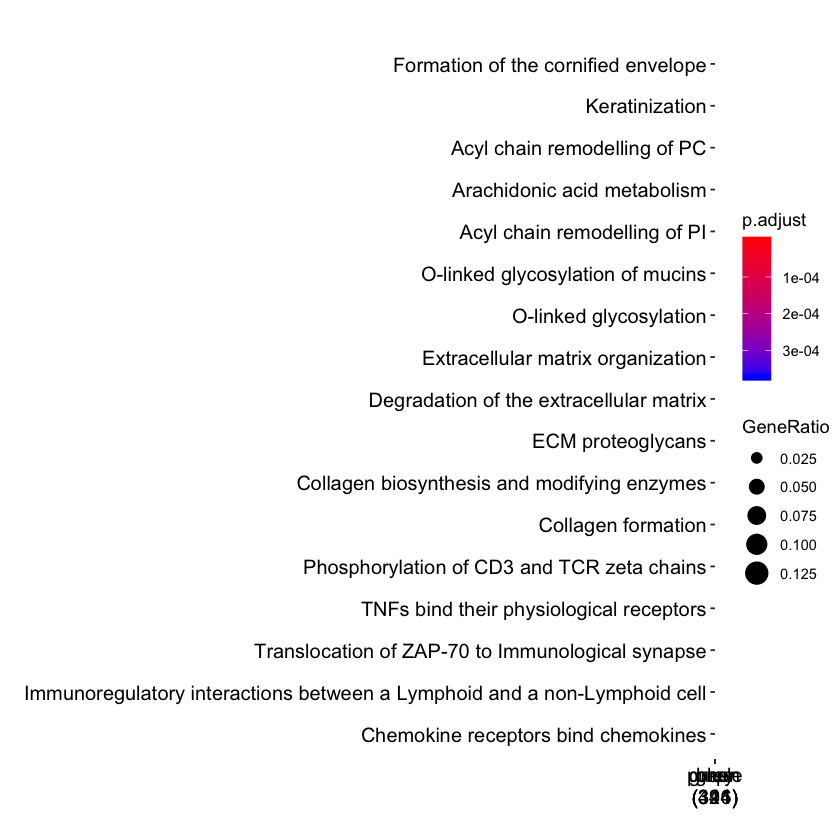

In [135]:
dotplot(ck_reactome_90)
ggsave(file = paste0(save_prefix, "ck_reactome_groups.png"),height=7, width=10)

In [138]:
ck_go_bp <- compareCluster(geneCluster = cluster_all, fun = "enrichGO", 
                                pAdjustMethod='BH', 
                                pvalueCutoff  = 0.05,
                                qvalueCutoff  = 0.05,
                                OrgDb='org.Hs.eg.db', 
                                ont = "BP",
                                readable=TRUE)
head(as.data.frame(ck_go_bp))
write.csv(ck_go_bp, file=paste0(save_prefix, 'ck_go_bp_05.csv'))

ck_go_mf <- compareCluster(geneCluster = cluster_all, fun = "enrichGO", 
                                pAdjustMethod='BH', 
                                pvalueCutoff  = 0.05,
                                qvalueCutoff  = 0.05,
                                OrgDb='org.Hs.eg.db', 
                                ont = "MF",
                                readable=TRUE)                              
head(as.data.frame(ck_go_mf))
write.csv(ck_go_mf, file=paste0(save_prefix, 'ck_go_mf_05.csv'))


ck_go_cc <- compareCluster(geneCluster = cluster_all, fun = "enrichGO", 
                                pAdjustMethod='BH', 
                                pvalueCutoff  = 0.05,
                                qvalueCutoff  = 0.05,
                                OrgDb='org.Hs.eg.db', 
                                ont = "CC",
                                readable=TRUE)
head(as.data.frame(ck_go_cc))
write.csv(ck_go_cc, file=paste0(save_prefix, 'ck_go_cc_05.csv'))

,Cluster,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
1,purple,GO:0008544,epidermis development,63/647,464/18670,9.073319e-21,3.858883e-17,3.569157e-17,CERS3/S100A7/BNC1/TP63/ZNF750/LCE1C/FGFR2/PRR9/ALOX15B/SLITRK6/GRHL3/LCE3E/KRT9/SULT2B1/ABCA12/SPRR2G/LCE1F/LCE1E/BCL11B/KRT23/KRTAP19-1/KRT75/NTF4/KRT31/HES5/KRT6C/OVOL1/CYP27B1/LCE1B/GRHL1/KRT78/KRTAP2-3/PKP3/KRT34/DLL1/KRT1/PRSS8/DSG1/OVOL2/KLK12/SPRR4/EDA2R/HOXC13/MYCL/CDSN/DSC1/STRC/EVPL/KRT24/FOXE1/KRT77/FLG2/TMEM79/FOXN1/POU3F1/IL20/RPTN/EXPH5/LIPK/DSG4/POU2F3/CYP26B1/C1orf68,63
2,purple,GO:0009913,epidermal cell differentiation,53/647,358/18670,2.585860e-19,5.498832e-16,5.085979e-16,CERS3/S100A7/TP63/LCE1C/PRR9/ALOX15B/SLITRK6/LCE3E/KRT9/SULT2B1/ABCA12/SPRR2G/LCE1F/LCE1E/BCL11B/KRT23/KRTAP19-1/KRT75/KRT31/HES5/KRT6C/OVOL1/CYP27B1/LCE1B/GRHL1/KRT78/KRTAP2-3/PKP3/KRT34/DLL1/KRT1/PRSS8/DSG1/OVOL2/KLK12/SPRR4/MYCL/CDSN/DSC1/STRC/EVPL/KRT24/KRT77/TMEM79/FOXN1/POU3F1/IL20/RPTN/EXPH5/LIPK/DSG4/CYP26B1/C1orf68,53
3,purple,GO:0043588,skin development,56/647,419/18670,3.048219e-18,4.321358e-15,3.996910e-15,CERS3/S100A7/TP63/LCE1C/FGFR2/PRR9/ALOX15B/GRHL3/LCE3E/KRT9/ABCA12/SPRR2G/LCE1F/LCE1E/BCL11B/KRT23/ALOXE3/KRTAP19-1/KRT75/KRT31/KRT6C/OVOL1/CYP27B1/LCE1B/GRHL1/KRT78/KRTAP2-3/PKP3/KRT34/DLL1/KRT1/PRSS8/DSG1/OVOL2/KLK12/SPRR4/ALOX12B/HOXC13/CDSN/DSC1/EVPL/KRT24/FOXE1/KRT77/FLG2/TMEM79/FOXN1/POU3F1/IL20/RPTN/EXPH5/LIPK/DSG4/CYP26B1/C1orf68/PKD1,56
4,purple,GO:0030216,keratinocyte differentiation,46/647,305/18670,3.152945e-17,3.352369e-14,3.100673e-14,CERS3/S100A7/TP63/LCE1C/PRR9/ALOX15B/LCE3E/KRT9/ABCA12/SPRR2G/LCE1F/LCE1E/BCL11B/KRT23/KRTAP19-1/KRT75/KRT31/KRT6C/CYP27B1/LCE1B/GRHL1/KRT78/KRTAP2-3/PKP3/KRT34/KRT1/PRSS8/DSG1/OVOL2/KLK12/SPRR4/CDSN/DSC1/EVPL/KRT24/KRT77/TMEM79/FOXN1/POU3F1/IL20/RPTN/EXPH5/LIPK/DSG4/CYP26B1/C1orf68,46
5,purple,GO:0070268,cornification,23/647,112/18670,4.513994e-12,3.839603e-09,3.551325e-09,KRT9/SPRR2G/KRT23/KRT75/KRT31/KRT6C/KRT78/PKP3/KRT34/KRT1/PRSS8/DSG1/KLK12/CDSN/DSC1/EVPL/KRT24/KRT77/TMEM79/RPTN/LIPK/DSG4/CYP26B1,23
6,purple,GO:0031424,keratinization,32/647,224/18670,1.015609e-11,7.198973e-09,6.658473e-09,LCE1C/LCE3E/KRT9/ABCA12/SPRR2G/LCE1F/LCE1E/KRT23/KRTAP19-1/KRT75/KRT31/KRT6C/LCE1B/KRT78/KRTAP2-3/PKP3/KRT34/KRT1/PRSS8/DSG1/KLK12/SPRR4/CDSN/DSC1/EVPL/KRT24/KRT77/TMEM79/RPTN/LIPK/DSG4/CYP26B1,32


,Cluster,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
1,purple,GO:0016298,lipase activity,18/635,127/17697,6.487362e-07,0.0004846059,0.0004302145,BDKRB2/PLCH2/PNLIPRP3/ASPG/PLA2G4F/EDNRA/PLA2G4A/PLA2G7/PLB1/PLA2G3/PLCB4/PLA2G4E/CEL/CES4A/LIPK/PLA2G2F/PITPNM3/PLD2,18
2,purple,GO:0048018,receptor ligand activity,38/635,482/17697,5.056392e-06,0.0018885625,0.0016765932,FLRT2/EPGN/IL36G/IL36RN/SEMA3F/SLURP1/NTF4/C17orf99/UCN2/IFNK/C10orf99/GAST/DEFB103B/SEMA3D/BMP2/FGF11/IL33/WNT7A/NODAL/THNSL2/GDNF/TSLP/FGF5/SEMA4A/ADM2/NGF/KITLG/WNT4/CCK/IL1F10/IL20/PPBP/INHBE/SEMA3G/TNFSF9/C1QTNF12/METRN/CCN6,38
3,purple,GO:0004620,phospholipase activity,14/635,102/17697,1.640425e-05,0.0040846587,0.0036262030,BDKRB2/PLCH2/ASPG/PLA2G4F/EDNRA/PLA2G4A/PLA2G7/PLB1/PLA2G3/PLCB4/PLA2G4E/PLA2G2F/PITPNM3/PLD2,14
4,purple,GO:0005506,iron ion binding,16/635,152/17697,1.161063e-04,0.0157852146,0.0140135069,ALOX15B/XDH/ALOXE3/CYP27C1/CYP27B1/BBOX1/ALOX12B/CYP4F22/CYP4F3/P3H3/CYP2W1/CYP2S1/CYP2C18/CYP26B1/KDM7A/CYP1A1,16
5,purple,GO:0034483,heparan sulfate sulfotransferase activity,5/635,15/17697,1.303145e-04,0.0157852146,0.0140135069,HS3ST2/HS6ST2/HS3ST3B1/HS3ST6/NDST1,5
6,purple,GO:0004623,phospholipase A2 activity,7/635,33/17697,1.401943e-04,0.0157852146,0.0140135069,PLA2G4F/PLA2G4A/PLA2G7/PLB1/PLA2G3/PLA2G4E/PLA2G2F,7


,Cluster,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
1,purple,GO:0001533,cornified envelope,18/678,65/19717,3.973464e-12,1.811900e-09,1.781785e-09,LCE1C/PRR9/LCE3E/SPRR2G/LCE1F/LCE1E/LCE1B/PKP3/KRT1/DSG1/SPRR4/CDSN/DSC1/EVPL/FLG2/RPTN/DSG4/C1orf68,18
2,purple,GO:0031225,anchored component of membrane,20/678,170/19717,1.685658e-06,3.843299e-04,3.779422e-04,FOLR3/RAET1L/CDH13/PRSS21/CNTN1/NTM/RAET1G/PRMT8/LY6G6C/LYPD5/ULBP1/PRSS8/CEACAM5/CNTN3/RAB27B/NTNG1/CD177/PRSS27/EFNA3/RAB3B,20
3,purple,GO:0030057,desmosome,7/678,25/19717,1.542035e-05,2.343893e-03,2.304937e-03,PKP3/POF1B/DSG1/CDSN/DSC1/EVPL/DSG4,7
4,purple,GO:0005911,cell-cell junction,33/678,459/19717,5.826899e-05,6.642664e-03,6.532260e-03,CDH13/FLRT2/NECTIN4/AJAP1/FAT2/CDH4/LAMA1/PKP3/GJB4/NFASC/SLC5A1/MPP7/PLEKHG5/POF1B/DSG1/GJA9/CDSN/DSC1/EPB41L4B/EVPL/TRPC6/CDH26/MARVELD2/RASIP1/SCN2A/CNKSR1/AMTN/SCN4B/DSG4/CAMSAP3/NHS/PRKCZ/ITGA5,33
5,green,GO:0062023,collagen-containing extracellular matrix,27/567,406/19717,5.196873e-05,2.089143e-02,2.024045e-02,SERPINA5/LUM/RARRES2/ADAMTS9/SERPINA1/APOC3/SERPINA3/COCH/COL6A2/ABI3BP/SERPINB9/SHH/ICAM1/LAMA4/COL4A4/KAZALD1/PDGFB/FRAS1/PRSS1/COL23A1/MATN3/EMILIN2/MATN2/FGB/ADAMTS8/FGFBP3/CDON,27
6,blue,GO:0099572,postsynaptic specialization,48/791,348/19717,6.957342e-14,3.318652e-11,2.570555e-11,LZTS1/SYT11/NLGN1/TMEM108/SAMD14/DCLK1/EPB41L3/GAP43/BAALC/NLGN4X/LIN7A/CNKSR2/GRIK2/SPOCK1/GRASP/ADD2/CLSTN2/DAB1/PRRT2/DLGAP1/GPER1/CTNND2/LRRC4C/PALM/NTRK2/SYNDIG1/RNF112/PTPRS/PDE4B/SORCS3/CPEB1/ADORA1/GNG3/CACNG7/DNM3/GABRA5/PLPPR4/DNM1/GRIN2A/DGKI/IGSF11/GRIK5/GABRB2/CTNNA2/DISC1/GRIA2/MAGI2/NLGN2,48


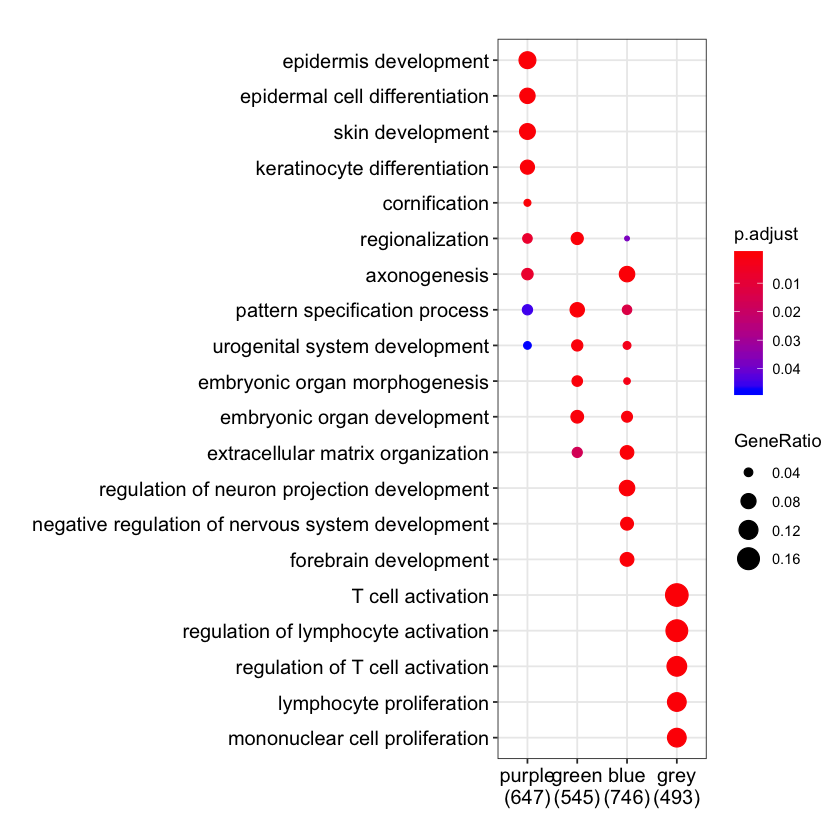

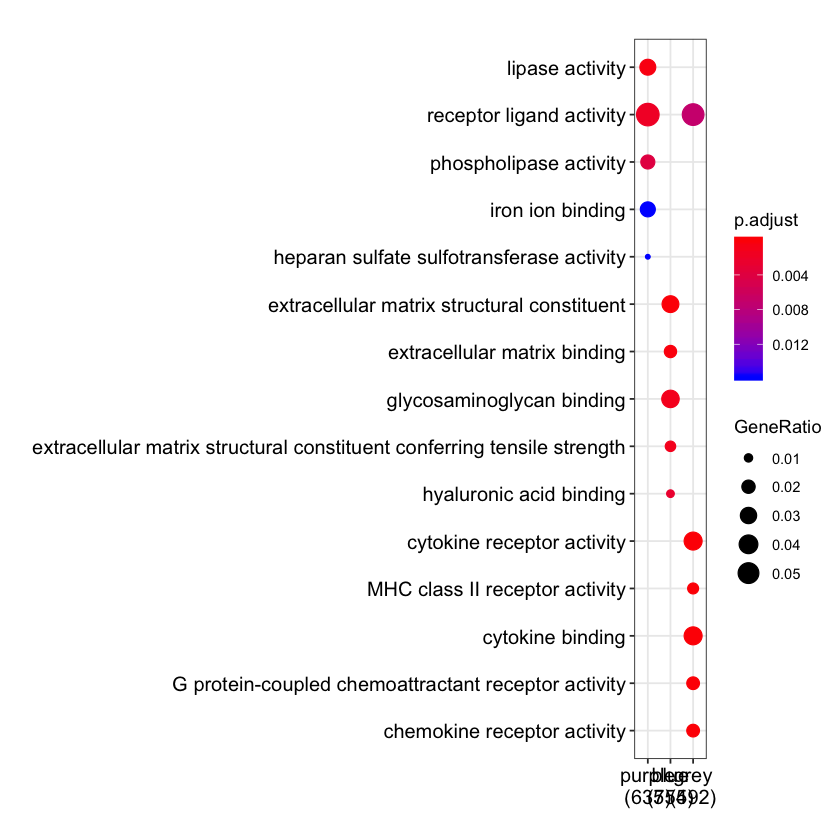

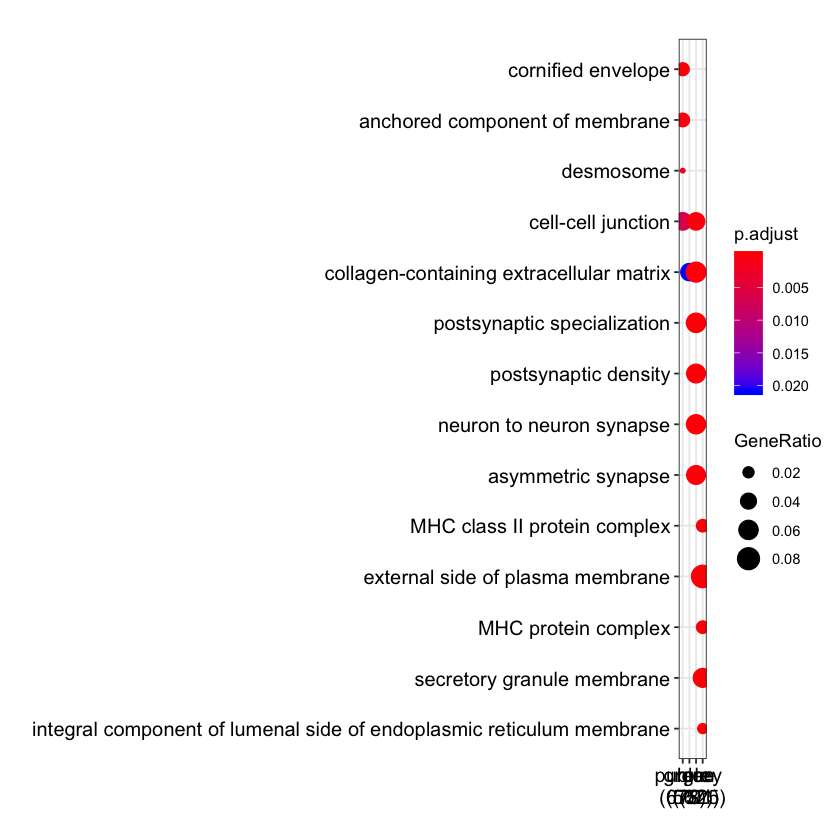

In [139]:
dotplot(ck_go_bp)
ggsave(file = paste0(save_prefix, "ck_go_bp_groups.png"),height=7, width=10)
dotplot(ck_go_mf)
ggsave(file = paste0(save_prefix, "ck_go_mf_groups.png"),height=7, width=10)
dotplot(ck_go_cc)
ggsave(file = paste0(save_prefix, "ck_go_cc_groups.png"),height=7, width=10)

# get tfs in each group

In [15]:
purple_genes = read.table(file = paste0(save_prefix, "purple_genes.csv"),stringsAsFactors=F)$V1
green_genes = read.table(file = paste0(save_prefix, "green_genes.csv"),stringsAsFactors=F)$V1
blue_genes = read.table(file = paste0(save_prefix, "blue_genes.csv"),stringsAsFactors=F)$V1
grey_genes = read.table(file = paste0(save_prefix, "grey_genes.csv"),stringsAsFactors=F)$V1

In [16]:
tf_df = read.csv('../data/external/HOCOMOCOv11_annotation.csv',)
tfs = as.character(tf_df$tf)

In [21]:
purple_tfs = purple_genes[purple_genes %in% tfs]
green_tfs = green_genes[green_genes %in% tfs]
blue_tfs = blue_genes[blue_genes %in% tfs]
grey_tfs = grey_genes[grey_genes %in% tfs]

length(purple_tfs)
length(green_tfs)
length(blue_tfs)
length(grey_tfs)

[1] 17

[1] 24

[1] 24

[1] 20

In [25]:
purple_tfs[length(c(green_tfs, blue_tfs, grey_tfs))]

[1] 68